Презентация <https://docs.google.com/presentation/d/1WRe4-aCzC44GGUHjFBSwf-fAxTiP4vGnhAWk3TfacyI/edit?usp=sharing>

#Пет-проект: Хоккей. Число Лемтюгова

## Цель проекта:
Создать аналог числа Эрдёша — Бэйкона для отечественных хоккеистов, называемый числом, чтобы измерять "близость" хоккеистов к Николаю Лемтюгову через команды, в которых они играли


Задачи проекта:
   1. Собрать данные об отечественных хоккеистах и командах, в которых они играли.
   2. Рассчитать число Лемтюгова для каждого хоккеиста.
   3. Построить дэшборд или отчет с графами, отображающими связи между хоккеистами и количеством команд, через которые они были связаны.


### План:
1. Описание данных
2. Загрузка данных и подготовка их к анализу
- Общая информация по датафрейму
- Проверить корректность наименований колонок
- Исследовать соответствие типов
- Проверка данных на наличие дубликатов

3. Расчет числа Лемтюгова
4. Визуализация графа
5. Проверка статистических гипотез
6. Выводы


## Описание данных

Датасет players2 - информация о переходах игроков:

- player_link - ссылка на команду        
- player - имя игрока        
- team - команда              
- start_date - дата начала
- end_date - дата конца

Датасет stat2_new - статистика по игрокам и играм:

- player_link - ссылка на игрока
- player - имя игрока     
- position - игровое амплуа
- born - дата рождения         
- age - возраст         
- country - страна рождения       
- hight - рост       
- weight - вес       
- shoot - захват клюшки         
- GP - количество игр           
- G - количество голов           
- Assists - количество передач    
- PTS - количество очков, присуждаемое в команде          
- +/- - очки +/-        
- '+' - очки +          
- '-' - очки минус

Статистика игроков по амплуа            
- PIM - штрафное время       
- ESG - шайбы в равенстве       
- PPG - шайбы в большинстве          
- SHG - шайбы в меньшенстве         
- OTG - шайбы в овертайме         
- GWG - победные голы        
- SDS - решающие проски в булитах         
- SOG - броски по воротам           
- %SOG - % реализованных         
- S/G - среднее количество бросков в ворота          
- FO - вбрасывания         
- FOW - выигранные вбрасывания         
- %FO - % выигранных вбрасываний         
- TOI/G - среднее время пребывания на льду/в игре         
- SFT/G - среднее количество смен за игру     
- TIE/G - среднее время игры на площадке при игре в равных составах за игру      
- SFTE/G - среднее количество смен при игре в равных составах за игру    
- TIPP/G - среднее время игры на площадке при игре в большинстве за игру   
- SFTPP/G - среднее количество смен при игре в большинстве за игру      
- TISH/G - среднее время игры на площадке при игре в меньшинстве за игру      
- SFTSH/G - среднее количество смен при игре в меньшинстве за игру       
- HITS - силовые приемы     
- BLS - блокированные броски         
- FOA - фолы против         
- TkA - отборы шайбы  

для вратарей:      
- W - выигрыши           
- L - проигрыши            
- SOP - игры с буллитными сериями
- SOG - броски         
- GA - пропущено шайб       
- Sv - отраженные броски  
- %Sv - % отраженных бросков         
- GAA  - коэффициент надежности         
- SO - сухие игры           


## Загрузка данных и подготовка их к анализу

In [215]:
!pip install scikit-image --quiet
!pip install datashader --quiet
!pip install holoviews==1.16 --quiet
!pip install bokeh==3.1.1 --quiet

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
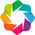

In [216]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta as dt

#Библиотека для парсинга json
import json

#Основные графические библиотеки
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

#Библиотека визуализации bokeh и фронтенд для вывода - holoviews
import holoviews as hv
import bokeh
from holoviews import opts, dim
import holoviews.plotting.bokeh
from bokeh.plotting import show, output_file
hv.extension('bokeh')

#request - чтобы подтягивать информацию с других сайтов - используется в функции отрисовки sankey чарта
import requests

#Для отображения прогресса - используется в функции отрисовки sankey чарта
from tqdm import tqdm

#Библиотека для работы с очередями - для прохода по графу
from queue import Queue

#Для работы с матрицей вместо графа
import scipy
from scipy.sparse import csr_matrix

#Для работы с графами и их визуализации
import networkx as nx

# для гипотез
from scipy import stats as st


In [217]:
#загрузка данных
players2 = pd.read_csv(
    'https://docs.google.com/spreadsheets/d/e/2PACX-1vT3TtrPT83dPIbAEtp5tjhpHmllTxYjFhJ62lThCeI9yPMeYwMCHPq9J5uoAL-Zcx3HvxMlXEeEl8iT/pub?output=csv',parse_dates=['start_date','end_date'], dayfirst=True)

In [218]:
#загрузка данных
stat2_new = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vT411kwpQk6lUrapB4bnsC1--cUkQMxWieItZ0sfIoYdmsO50Lu_hWws-r_UBfaww/pub?output=csv')

### Общая информация по датафрейму

In [219]:
list_data = [players2, stat2_new] #сохраним названия датафреймов в список

In [220]:
players2.info()#выведем общую информацию

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8179 entries, 0 to 8178
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   player_link  8179 non-null   object        
 1   player       8179 non-null   object        
 2   team         8179 non-null   object        
 3   start_date   8179 non-null   datetime64[ns]
 4   end_date     8179 non-null   datetime64[ns]
dtypes: datetime64[ns](2), object(3)
memory usage: 319.6+ KB


8179 строк. Пропусков нет

In [221]:
players2.head(1)

,player_link,player,team,start_date,end_date
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02


In [222]:
stat2_new.info()#выведем общую информацию

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3717 entries, 0 to 3716
Data columns (total 49 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   player_link  3717 non-null   object 
 1   player       3717 non-null   object 
 2   position     3717 non-null   object 
 3   born         3717 non-null   object 
 4   age          3717 non-null   object 
 5   country      3717 non-null   object 
 6   hight        3717 non-null   int64  
 7   weight       3717 non-null   int64  
 8   shoot        3717 non-null   object 
 9   GP           3717 non-null   int64  
 10  G            3717 non-null   int64  
 11  Assists      3717 non-null   int64  
 12  PTS          3226 non-null   float64
 13  +/-          3226 non-null   float64
 14  +            3226 non-null   float64
 15  -            3226 non-null   float64
 16  PIM          3717 non-null   int64  
 17  ESG          3226 non-null   float64
 18  PPG          3226 non-null   float64
 19  SHG   

3717 строк. Есть пропуски. Информация не внесена, если для амплуа игрока она не предусмотрена

In [223]:
stat2_new.head(1)

,player_link,player,position,born,age,country,hight,weight,shoot,GP,...,FOA,TkA,W,L,SOP,GA,Sv,%Sv,GAA,SO
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,forward,4-июн.-85,38,Finland,184,89,right,245,...,22.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Пропуски: количество и в % выражении

In [224]:
#Код ревьюера - смотрим количество и долю пропусков/функция
def isna_data(df):
   display(pd.concat(
    [
        df.isna().sum(),
        df.isna().mean().apply('{:.2%}'.format)
    ], axis=1,
    keys=['nan_count', 'nan_share']
).sort_values(by='nan_count', ascending=False)
)

In [225]:
isna_data(stat2_new)

,nan_count,nan_share
SO,3226,86.79%
GAA,3226,86.79%
%Sv,3226,86.79%
Sv,3226,86.79%
GA,3226,86.79%
SOP,3226,86.79%
L,3226,86.79%
W,3226,86.79%
SFTPP/G,491,13.21%
FOW,491,13.21%


In [226]:
isna_data(players2)

,nan_count,nan_share
player_link,0,0.00%
player,0,0.00%
team,0,0.00%
start_date,0,0.00%
end_date,0,0.00%


### Исследовать соответствие типов

В этом разделе добавим новый столбец link с id игрока, извлеченного из 'player_link', во всех датасетах.

In [227]:
players2.info()#выведем общую информацию

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8179 entries, 0 to 8178
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   player_link  8179 non-null   object        
 1   player       8179 non-null   object        
 2   team         8179 non-null   object        
 3   start_date   8179 non-null   datetime64[ns]
 4   end_date     8179 non-null   datetime64[ns]
dtypes: datetime64[ns](2), object(3)
memory usage: 319.6+ KB


С типом данных все в порядке

In [228]:
len(players2['player'].unique())# найдем количество уникальных игроков по имени


3712

In [229]:
#выделим id игрока из ссылки на профиль
players2['link'] = players2['player_link'].str.extract(r'/(\d+)/')
players2.head(1)

,player_link,player,team,start_date,end_date,link
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785


In [230]:
len(players2['link'].unique())# найдем количество уникальных игроков по id

3720

Получили на 8 игроков больше, в данных есть тезки.

In [231]:
stat2_new.info() #выведем общую информацию

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3717 entries, 0 to 3716
Data columns (total 49 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   player_link  3717 non-null   object 
 1   player       3717 non-null   object 
 2   position     3717 non-null   object 
 3   born         3717 non-null   object 
 4   age          3717 non-null   object 
 5   country      3717 non-null   object 
 6   hight        3717 non-null   int64  
 7   weight       3717 non-null   int64  
 8   shoot        3717 non-null   object 
 9   GP           3717 non-null   int64  
 10  G            3717 non-null   int64  
 11  Assists      3717 non-null   int64  
 12  PTS          3226 non-null   float64
 13  +/-          3226 non-null   float64
 14  +            3226 non-null   float64
 15  -            3226 non-null   float64
 16  PIM          3717 non-null   int64  
 17  ESG          3226 non-null   float64
 18  PPG          3226 non-null   float64
 19  SHG   

Есть несоответствие типов содержимому в столбцах. Изменим при необходимости в ходе анализа.

In [232]:
len(stat2_new['player'].unique()) #найдем кооличество игроков в датасете

3709

In [233]:
#выделим id игрока из ссылки на профиль
stat2_new['link'] = stat2_new['player_link'].str.extract(r'/(\d+)/')
stat2_new.head(1)

,player_link,player,position,born,age,country,hight,weight,shoot,GP,...,TkA,W,L,SOP,GA,Sv,%Sv,GAA,SO,link
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,forward,4-июн.-85,38,Finland,184,89,right,245,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16785


In [234]:
len(stat2_new['link'].unique())#найдем кооличество игроков в датасете по id

3717

In [235]:
#найдем трех игроков, по которым нет мнформации о переходах
uniq = stat2_new['link'].unique()#список игроков в stat2_new uniq
players2.query('link not in @uniq')# срез по списку uniq

,player_link,player,team,start_date,end_date,link
4591,https://en.khl.ru/players/16439/?idplayer=1643...,Adam Munro,Sibir,2010-01-16,2010-03-07,16439
4848,https://en.khl.ru/players/15624/?idplayer=1562...,Alexander Novikov,Vityaz,2009-01-27,2009-02-26,15624
6415,https://en.khl.ru/players/15246/?idplayer=1524...,Igor Shvedov,Dinamo Mn,2009-01-27,2009-02-26,15246


Для 3 игроков данных в players2 (о переходах) нет

### Проверка данных на наличие дубликатов

In [236]:
players2.duplicated().sum() #найдем явные дубликаты

0

Явных дубликатов нет.

In [237]:
stat2_new.duplicated().sum() #найдем явные дубликаты

0

Явных дубликатов нет.

## Анализ данных

### Построим график переходов игроков в команды

Sankey Chart: визуализируем переходы между командами
Чтобы строить sankey, у вас должна быть готова таблица с информацией по трансферам игроков - даты здесь не так важны, как сами переходы из команды в команду - т.е. эту визуализацию можем строить практически сразу.

Для построения Sankey чатра воспользуемся тьюториалом отсюда: https://habr.com/ru/articles/566568/ и документацией plotly по Sankey: https://plotly.com/python/sankey-diagram/

In [238]:
players2.head()# выведем первые 5 строк

,player_link,player,team,start_date,end_date,link
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785
1,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Metallurg Mg,2010-09-09,2012-03-22,16785
2,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,Vityaz,2021-09-02,2022-01-11,17585
3,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,SKA,2019-12-17,2021-02-27,17585
4,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,Vityaz,2016-08-27,2019-12-09,17585


Для построения графика перехода выделим 10 команд, с наибольшим количеством игроков

In [239]:
top_teams = players2.groupby('team').agg(
    num_players=('link', 'count')).sort_values(by='num_players', ascending=False)[:10].index # группируем по командам, сортируем по сумме игроков в команде

top_teams

Index(['Spartak', 'Neftekhimik', 'Amur', 'Torpedo', 'Vityaz', 'Severstal',
       'Avtomobilist', 'Dinamo Mn', 'CSKA', 'Avangard'],
      dtype='object', name='team')

In [240]:
players2_top10_team = players2.query('team in @top_teams').copy() #выделим датасет с командами в top_teams
#players2_top10_team

Добавим необходимые столбцы в датасете:

In [241]:
def add_features(df):

    """Функция генерации новых столбцов для исходной таблицы

    Args:
        df (pd.DataFrame): исходная таблица.
    Returns:
        pd.DataFrame: таблица с новыми признаками.
    """

    # сортируем по id и времени
    sorted_df = players2_top10_team.sort_values(by=['link', 'start_date']).copy()
    # добавляем шаги событий
    sorted_df['step'] = sorted_df.groupby('link').cumcount() + 1

    # добавляем узлы-источники и целевые узлы
    # узлы-источники - это сами события
    sorted_df['source'] = sorted_df['team']
    # добавляем целевые узлы
    sorted_df['target'] = sorted_df.groupby('link')['source'].shift(-1)

    # возврат таблицы без имени событий
    return sorted_df.drop(['team'], axis=1)

# преобразуем таблицу
players_step = add_features(players2_top10_team)
players_step.head()





,player_link,player,start_date,end_date,link,step,source,target
3886,https://en.khl.ru/players/1/?idplayer=1&PAGEN_1=1,Evgeny Lobanov,2008-11-12,2009-11-21,1,1,Torpedo,Avtomobilist
3885,https://en.khl.ru/players/1/?idplayer=1&PAGEN_1=1,Evgeny Lobanov,2011-09-14,2014-09-30,1,2,Avtomobilist,NaN
515,https://en.khl.ru/players/10176/?idplayer=1017...,Anton Belov,2008-09-03,2013-03-16,10176,1,Avangard,Avangard
512,https://en.khl.ru/players/10176/?idplayer=1017...,Anton Belov,2022-09-03,2023-04-09,10176,2,Avangard,NaN
5908,https://en.khl.ru/players/10546/?idplayer=1054...,Yakov Rylov,2009-09-11,2011-01-28,10546,1,CSKA,Neftekhimik


In [242]:
df_comp = players_step[players_step['step'] <= 7].copy().reset_index(drop=True)# оставим в датасете информацию о первых 7ми шагах

In [243]:
def get_source_index(df):

    """Функция генерации индексов source

    Args:
        df (pd.DataFrame): исходная таблица с признаками step, source, target.
    Returns:
        dict: словарь с индексами, именами и соответсвиями индексов именам source.
    """

    res_dict = {}

    count = 0
    # получаем индексы источников
    for no, step in enumerate(df['step'].unique().tolist()):
        # получаем уникальные наименования для шага
        res_dict[no+1] = {}
        res_dict[no+1]['sources'] = df[df['step'] == step]['source'].unique().tolist()
        res_dict[no+1]['players'] = df[df['step'] == step]['player'].unique().tolist()
        res_dict[no+1]['sources_index'] = []
        for i in range(len(res_dict[no+1]['sources'])):
            res_dict[no+1]['sources_index'].append(count)
            count += 1

    # соединим списки
    for key in res_dict:
        res_dict[key]['sources_dict'] = {}
        for name, no in zip(res_dict[key]['sources'], res_dict[key]['sources_index']):
            res_dict[key]['sources_dict'][name] = no
    return res_dict
source_indexes = get_source_index(df_comp)
#source_indexes


In [244]:
def generate_random_color():

    """Случайная генерация цветов rgba

    Args:

    Returns:
        str: Строка со сгенерированными параметрами цвета
    """

    # сгенерим значение для каждого канала
    r, g, b = np.random.randint(255, size=3)
    return f'rgba({r}, {g}, {b}, 1)'

In [245]:
def colors_for_sources(mode):

    """Генерация цветов rgba

    Args:
        mode (str): сгенерировать случайные цвета, если 'random', а если 'custom' -
                    использовать заранее подготовленные
    Returns:
        dict: словарь с цветами, соответствующими каждому индексу
    """
    # словарь, в который сложим цвета в соответствии с индексом
    colors_dict = {}

    if mode == 'random':
        # генерим случайные цвета
        for label in df_comp['source'].unique():
            r, g, b = np.random.randint(255, size=3)
            colors_dict[label] = f'rgba({r}, {g}, {b}, 1)'

    elif mode == 'custom':
        # присваиваем ранее подготовленные цвета
        colors = requests.get('https://raw.githubusercontent.com/rusantsovsv/senkey_tutorial/main/json/colors_senkey.json').json()
        for no, label in enumerate(df_comp['source'].unique()):
            colors_dict[label] = colors['custom_colors'][no]

    return colors_dict


# генерю цвета из своего списка
colors_dict = colors_for_sources(mode='custom')

In [246]:
def percent_users(sources, targets, values):

    """
    Расчет уникальных id в процентах (для вывода в hover text каждого узла)

    Args:
        sources (list): список с индексами source.
        targets (list): список с индексами target.
        values (list): список с "объемами" потоков.

    Returns:
        list: список с "объемами" потоков в процентах
    """

    # объединим источники и метки и найдем пары
    zip_lists = list(zip(sources, targets, values))

    new_list = []

    # подготовим список словарь с общим объемом трафика в узлах
    unique_dict = {}

    # проходим по каждому узлу
    for source, target, value in zip_lists:
        if source not in unique_dict:
            # находим все источники и считаем общий трафик
            unique_dict[source] = 0
            for sr, tg, vl in zip_lists:
                if sr == source:
                    unique_dict[source] += vl

    # считаем проценты
    for source, target, value in zip_lists:
        new_list.append(round(100 * value / unique_dict[source], 1))

    return new_list

In [247]:
def lists_for_plot(source_indexes=source_indexes, colors=colors_dict, frac=0):

    """
    Создаем необходимые для отрисовки диаграммы переменные списков и возвращаем
    их в виде словаря

    Args:
        source_indexes (dict): словарь с именами и индексами source.
        colors (dict): словарь с цветами source.
        frac (int): ограничение на минимальный "объем" между узлами.

    Returns:
        dict: словарь со списками, необходимыми для диаграммы.
    """

    sources = []
    targets = []
    values = []
    labels = []
    link_color = []
    link_text = []

    # проходим по каждому шагу
    for step in tqdm(sorted(df_comp['step'].unique()), desc='Шаг'):
        if step + 1 not in source_indexes:
            continue

        # получаем индекс источника
        temp_dict_source = source_indexes[step]['sources_dict']

        # получаем индексы цели
        temp_dict_target = source_indexes[step+1]['sources_dict']

        # проходим по каждой возможной паре, считаем количество таких пар
        for source, index_source in tqdm(temp_dict_source.items()):
            for target, index_target in temp_dict_target.items():
                # делаем срез данных и считаем количество id
                temp_df = df_comp[(df_comp['step'] == step)&(df_comp['source'] == source)&(df_comp['target'] == target)]
                value = len(temp_df)
                # проверяем минимальный объем потока и добавляем нужные данные
                if value > frac:
                    sources.append(index_source)
                    targets.append(index_target)
                    values.append(value)
                    # делаем поток прозрачным для лучшего отображения
                    link_color.append(colors[source].replace(', 1)', ', 0.2)'))

    labels = []
    colors_labels = []
    for key in source_indexes:
        for name in source_indexes[key]['sources']:
            labels.append(name)
            colors_labels.append(colors[name])

    # посчитаем проценты всех потоков
    perc_values = percent_users(sources, targets, values)

    # добавим значения процентов для howertext
    link_text = []
    for perc in perc_values:
        link_text.append(f"{perc}%")

    # возвратим словарь с вложенными списками
    return {'sources': sources,
            'targets': targets,
            'values': values,
            'labels': labels,
            'colors_labels': colors_labels,
            'link_color': link_color,
            'link_text': link_text}
# создаем словарь
data_for_plot = lists_for_plot()

Шаг: 100%|██████████| 7/7 [00:01<00:00,  6.93it/s]


In [248]:
def plot_senkey_diagram(title, data_dict=data_for_plot, width=1300, height=700):

    """
    Функция для генерации объекта диаграммы Сенкей

    Args:
        data_dict (dict): словарь со списками данных для построения.

    Returns:
        plotly.graph_objs._figure.Figure: объект изображения.
    """

    fig = go.Figure(data=[go.Sankey(
        domain = dict(
          x = [0,1],
          y = [0,1]
        ),
        orientation = "h",
        valueformat = ".0f",
        node = dict(
          pad=50,
          thickness=15,
          line=dict(color = "black", width = 0.1),
          label=data_dict['labels'],
          color=data_dict['colors_labels'],
          #customdata=data_dict['players'],
          hovertemplate='Всего переходов у команды %{label}: %{value}<extra></extra>'
        ),
        link = dict(
          arrowlen=15,
          source=data_dict['sources'],
          target=data_dict['targets'],
          value=data_dict['values'],
          label=data_dict['link_text'],
          color=data_dict['link_color'],
          customdata=data_dict['link_text'],
          hovertemplate='Из команды %{source.label}<br />'+
        'в команду %{target.label}<br /> перешло игроков: %{value}'+
        ', что составляет %{customdata}<br />',
      ))])
    fig.update_layout(title_text=title, font_size=10, width=width, height=height)



    # возвращаем объект диаграммы
    return fig


In [249]:
# строим диаграмму
senkey_diagram = plot_senkey_diagram('Переходы топ-10 команд игроков между командами КХЛ')
senkey_diagram.show()

Присоединим датасет players2 сам к себе для нахождения одноклубников

In [250]:
merged_pl2= players2.merge(players2,left_on='team', right_on='team', how='left' )# соединяем 2 датасета
merged_pl2.head(10)

,player_link_x,player_x,team,start_date_x,end_date_x,link_x,player_link_y,player_y,start_date_y,end_date_y,link_y
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,2014-09-04,2016-03-02,16785
1,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/19127/?idplayer=1912...,Niclas Andersen,2017-11-17,2018-03-24,19127
2,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/20970/?idplayer=2097...,Marko Anttila,2016-08-23,2022-01-05,20970
3,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/22344/?idplayer=2234...,Semir Ben-Amor,2014-09-04,2015-03-13,22344
4,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/33809/?idplayer=3380...,Hannes Bjorninen,2021-09-02,2022-01-11,33809
5,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/26243/?idplayer=2624...,Erik Embrich,2018-03-20,2018-12-07,26243
6,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/22140/?idplayer=2214...,Teemu Eronen,2019-09-03,2020-02-25,22140
7,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/33782/?idplayer=3378...,Niklas Friman,2020-09-09,2022-01-05,33782
8,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/22801/?idplayer=2280...,Charles Genoway,2016-08-23,2017-02-27,22801
9,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/22449/?idplayer=2244...,Matthew Gilroy,2017-08-23,2018-03-24,22449


удалим строки, пересечения игроков с самим собой:

In [251]:
merged_pl2 = merged_pl2.loc[(merged_pl2['link_x']!= merged_pl2['link_y'])].copy()

Найдем одноклубников, совместим игроков по датам


In [252]:
# установим флаг для игроков, игравших в командах в одно  время
merged_pl2['flag'] = np.where((merged_pl2['start_date_x']<=merged_pl2['end_date_y'])&(merged_pl2['end_date_x']>=merged_pl2['start_date_y']), 1,0)

In [253]:
merged_pl2.head(1)

,player_link_x,player_x,team,start_date_x,end_date_x,link_x,player_link_y,player_y,start_date_y,end_date_y,link_y,flag
1,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/19127/?idplayer=1912...,Niclas Andersen,2017-11-17,2018-03-24,19127,0


In [254]:
merged_pl2['flag'].value_counts()#выведем частоту значений 1 и 0

0    1758350
1     417922
Name: flag, dtype: int64

Получили: 417922 одноклубников играли вместе.

Посмотрим, у каких игроков больше одноклубников

In [255]:
# группируем по имени и id, находим количество уникальных одноклубников
t = merged_pl2.query('flag ==1').groupby(['player_x', 'link_x'])['link_y'].nunique().sort_values(ascending=False)[:15]
t

player_x            link_x
Evgeny Lapenkov     4351      475
Gennady Stolyarov   548       467
Denis Kazionov      14299     464
Vladimir Galuzin    14815     454
Denis Parshin       494       446
Alexander Lazushin  14674     445
Yakov Rylov         10546     443
Mikhail Grigoryev   14867     437
Ilya Proskuryakov   13871     436
Nikita Tochitsky    15846     430
Alexei Kruchinin    16355     423
Mikhail Zhukov      13679     418
Ilya Krikunov       125       416
Zakhar Arzamastsev  16220     413
Stanislav Galimov   14426     409
Name: link_y, dtype: int64

Больше всего одноклубников у :
Евгения Лапенкова - 475, Геннадия Столярова - 467 и Дениса Казионова - 464.


## Число Лемтюгова

Для каждого хоккеиста необходимо рассчитать число Лемтюгова.

Число Лемтюгова можно определить как минимальное количество команд, через которые данный хоккеист связан с Николаем Лемтюговым.
Одноклубниками считаются хоккеисты, которые были участниками одной команды в одно время (с учетом переходов игроков).
Учитываются одноклубники по лиге КХЛ.

Словарь link : players

In [256]:
# создадим словарь, link (id) будет соответствовать имя игрока
id_dic = players2[['link', 'player']].to_dict('records')
players_dict = {}
for i in id_dic:
  for k, v in i.items():
    players_dict.update({i['link']: i['player']})

In [257]:
search_name = 'Nikolai Lemtyugov'# найдем id Лемтюгова
[link for link, name in players_dict.items() if name == search_name]

['13705']

In [258]:
players2.loc[(players2['player']== 'Nikolai Lemtyugov')].head(1)

,player_link,player,team,start_date,end_date,link
3746,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Avangard,2015-08-25,2018-03-10,13705


Выделим датасет с игроками и их одноклубниками, которые пересекались по времени:

In [259]:
play_together = merged_pl2[merged_pl2['flag']==1].copy()
play_together = play_together[['link_x', 'link_y']]# выведем 2 столбца датасета


In [260]:
play_together.head()# выведем первые строки

,link_x,link_y
3,16785,22344
11,16785,22345
12,16785,22372
14,16785,19382
15,16785,22353


Создадим словарь, в котором ключом будет игрок, а значениями - его одноклубники.

In [261]:
dicto = play_together.groupby('link_x').agg({'link_y': 'unique'}).to_dict()

In [262]:
#dicto

In [263]:
#Убираем индекс (link_y)- перекладываем значения в новый словарь
newd = {}
for k, v in dicto.items():
  newd.update(v)

In [264]:
#newd

In [265]:
#Конвертируем значения из массива в список
for k, v in newd.items():
  newd[k] = v.tolist()

In [266]:
#newd

Функция обхода графа:

Напишем функцию для обхода графа и поиска кратчайшего пути между его вершинами.

Будем использовать такой тип данных, как очередь, и сохранять результаты обхода в словарь.

прикладываю ссылку на источник мудрости:

https://www.pythonforbeginners.com/data-structures/shortest-path-length-from-a-vertex-to-other-vertices-in-a-graph

И еще один источник мудрости: https://pimiento.github.io/python_graphs.html - если заходим выводить не просто число, а путь до игрока, можем использовать мануалы с этой страницы.

In [267]:
def calculate_distance(input_graph, source):
    Q = Queue()
    distance_dict = {k: 999999999 for k in input_graph.keys()}
    visited_vertices = list()
    Q.put(source)
    visited_vertices.append(source)
    while not Q.empty():
        vertex = Q.get()
        if vertex == source:
            distance_dict[vertex] = 0
        for u in input_graph[vertex]:
            if u not in visited_vertices:
                # update the distance
                if distance_dict[u] > distance_dict[vertex] + 1:
                    distance_dict[u] = distance_dict[vertex] + 1
                Q.put(u)
                visited_vertices.append(u)
    return distance_dict

In [268]:
search_name = 'Nikolai Lemtyugov'
[link for link, name in players_dict.items() if name == search_name]

['13705']

In [269]:
#Рассчитываем число Лемтюгова - чем число больше, тем дальше игроки друг от друга, если число равно 999999999, то игроки не связаны
distances = calculate_distance(newd,'13705')

In [270]:
# Преобразуем словарь в датафрейм
lemtyugov_number = pd.DataFrame.from_dict(distances, orient='index').reset_index().rename(columns={'index': 'link', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
lemtyugov_number['player'] = lemtyugov_number['link'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
lemtyugov_number = lemtyugov_number[['link', 'player', 'number']]
lemtyugov_number.sort_values(by='number', ascending=False)

,link,player,number
2706,28636,Ty Schultz,3
2878,32570,Rasmus Lahnaviik,3
2873,32393,Yegor V. Guskov,3
3312,39895,Alex Lintuniemi,3
3026,3496,Marat Davydov,3
...,...,...,...
2149,22606,Alexei Zubov,1
1476,18818,Vadim Shchegolkov,1
2155,22669,Derek Roy,1
1472,18793,David Nosek,1


In [271]:
lemtyugov_number['number'].agg(['mean', 'median'])# найдем среднее и медианное значение числа Лемтюгова

mean      1.923656
median    2.000000
Name: number, dtype: float64

Среднее и медианное значения числа Лемтюгова почти равны.

In [272]:
players2.loc[(players2['link']== '13705')].sort_values(by= 'start_date')

,player_link,player,team,start_date,end_date,link
3756,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Severstal,2008-12-24,2010-01-12,13705
3755,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Ak Bars,2010-01-14,2011-10-28,13705
3754,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Metallurg Mg,2011-11-04,2011-12-27,13705
3753,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Neftekhimik,2012-01-05,2012-02-26,13705
3752,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Atlant,2012-09-05,2012-12-23,13705
3751,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Traktor,2013-01-04,2013-04-15,13705
3750,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Sibir,2013-09-05,2013-12-08,13705
3749,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Spartak,2013-12-13,2014-03-04,13705
3748,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Avangard,2014-09-04,2014-12-10,13705
3747,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,Ugra,2014-12-30,2015-02-24,13705


In [273]:
stat2_new.loc[(stat2_new['link']== '13705')]

,player_link,player,position,born,age,country,hight,weight,shoot,GP,...,TkA,W,L,SOP,GA,Sv,%Sv,GAA,SO,link
1643,https://en.khl.ru/players/13705/?idplayer=1370...,Nikolai Lemtyugov,forward,15-янв.-86,37,Russia,184,96,left,416,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13705


Н. Лемтюгов 1986 года рождения, играет с конца 2008 года. Найдем для сравнения "число Лемтюгова" для других игроков.

Посчитаем тоже самое для другого игрока, напиример для Ty Schultz id - 28636

In [274]:
#Рассчитываем число Лемтюгова - чем число больше, тем дальше игроки друг от друга, если число равно 999999999, то игроки не связаны
distances_Schultz = calculate_distance(newd,'28636')

In [275]:
# Преобразуем словарь в датафрейм
Schultz_number = pd.DataFrame.from_dict(distances_Schultz, orient='index').reset_index().rename(columns={'index': 'link', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
Schultz_number['player'] = lemtyugov_number['link'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
Schultz_number = Schultz_number[['link', 'player', 'number']]
Schultz_number.sort_values(by='number', ascending=False)

,link,player,number
1860,20930,Mark Katic,3
2210,23318,Chad Kolarik,3
2213,23334,Artyom Korepanov,3
2214,23335,Mark Owuya,3
2215,23337,Georgy Kuznetsov,3
...,...,...,...
3041,35045,Garet Hunt,1
3012,34832,Jason Fram,1
1077,16740,Tomas Jurco,1
2626,26926,Brandon Yip,1


In [276]:
Schultz_number['number'].agg(['mean', 'median'])

mean      2.61586
median    3.00000
Name: number, dtype: float64

In [277]:
players2.loc[(players2['link']== '28636')]

,player_link,player,team,start_date,end_date,link
6042,https://en.khl.ru/players/28636/?idplayer=2863...,Ty Schultz,Kunlun RS,2021-10-02,2022-12-23,28636


In [278]:
stat2_new.loc[(stat2_new['link']== '28636')]

,player_link,player,position,born,age,country,hight,weight,shoot,GP,...,TkA,W,L,SOP,GA,Sv,%Sv,GAA,SO,link
2630,https://en.khl.ru/players/28636/?idplayer=2863...,Ty Schultz,defense,5-мар.-97,26,China,185,91,right,46,...,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28636


 Ty Schultz так же связан со всеми одноклубниками через 3 человека, но медианное и среднее значения "числа Лемтюгова" выше. Это можно объяснить , тем что игрок достаточно молод и пока играл только в 1 команде.

Игрок Evgeny Lapenkov, id - 4351

In [279]:
#Рассчитываем число Лемтюгова - чем число больше, тем дальше игроки друг от друга, если число равно 999999999, то игроки не связаны
distances_Lapenkov = calculate_distance(newd,'4351')

In [280]:
# Преобразуем словарь в датафрейм
Lapenkov_number = pd.DataFrame.from_dict(distances_Lapenkov, orient='index').reset_index().rename(columns={'index': 'link', 0: 'number'})

# Добавляем имя игрока из словаря с id игроков
Lapenkov_number['player'] = Lapenkov_number['link'].map(players_dict)

#Меняем порядок столбцов и сортируем по числу в порядке убывания
Lapenkov_number = Lapenkov_number[['link', 'player', 'number']]
Lapenkov_number.sort_values(by='number', ascending=False)

,link,player,number
2263,23560,Alexander Melikhov,3
3465,42245,Michael Chaput,3
1299,17663,Roman Rachinsky,3
1588,19098,David Printz,3
1293,17651,Kamil Kreps,3
...,...,...,...
1560,19036,Vladislav Voropayev,1
1566,19050,Andrei Yerofeyev,1
1569,19058,Anatoly Golyshev,1
3719,99,Evgeny Skachkov,1


In [281]:
Lapenkov_number['number'].agg(['mean', 'median'])

mean      1.888978
median    2.000000
Name: number, dtype: float64

In [282]:
players2.loc[(players2['link']== '4351')].sort_values(by= 'start_date')

,player_link,player,team,start_date,end_date,link
3660,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Neftekhimik,2008-09-03,2010-01-16,4351
3659,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Spartak,2010-01-20,2011-01-19,4351
3658,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Neftekhimik,2011-01-28,2011-10-24,4351
3657,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Ak Bars,2011-11-02,2012-03-24,4351
3656,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Ugra,2012-09-08,2012-10-28,4351
3655,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Avtomobilist,2012-11-14,2013-02-17,4351
3654,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Metallurg Nk,2013-09-09,2014-03-04,4351
3653,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Avtomobilist,2014-09-04,2014-09-30,4351
3652,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,HC Sochi,2014-10-05,2015-02-24,4351
3651,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,Neftekhimik,2015-08-26,2015-10-29,4351


In [283]:
stat2_new.loc[(stat2_new['link']== '4351')]

,player_link,player,position,born,age,country,hight,weight,shoot,GP,...,TkA,W,L,SOP,GA,Sv,%Sv,GAA,SO,link
3622,https://en.khl.ru/players/4351/?idplayer=4351&...,Evgeny Lapenkov,forward,1-авг.-84,38,Russia,192,100,left,569,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4351


У Лапенкова среднее "число Лемтюгова" даже ниже, чем у самого Лемтюгова. При этом он тоже начал играть с конца 2008 года.

## Визуализация графа

In [284]:
play_together.groupby('link_x').agg({'link_y': 'unique'})# сгруппируем по игроку, найдем список уникальных одноклубников для каждого

,link_y
link_x,
1,"[13873, 13490, 9435, 13923, 15889, 16119, 1929..."
10162,"[23494, 23973, 24048, 20083, 16074, 28452, 254..."
10176,"[23249, 39290, 26339, 16672, 17609, 39158, 272..."
10427,"[14763, 14876, 4512, 13806, 14478, 6303, 13226..."
10541,"[19232, 14929, 15948, 13923, 22519, 15129, 151..."
...,...
9859,"[27280, 25049, 13806, 19530, 14822, 23514, 211..."
9860,"[13873, 13490, 9435, 3739, 16119, 13061, 3607,..."
9862,"[25268, 27236, 22027, 25206, 19624, 27228, 189..."


In [285]:
# добавим имена игроков
play_together_names = pd.DataFrame()
play_together_names['link_x'] = play_together['link_x']
play_together_names['player_x'] = play_together['link_x'].map(players_dict)
play_together_names['link_y'] = play_together['link_y']
play_together_names['player_y'] = play_together['link_y'].map(players_dict)
play_together_names

,link_x,player_x,link_y,player_y
3,16785,Juhamatti Aaltonen,22344,Semir Ben-Amor
11,16785,Juhamatti Aaltonen,22345,Ryan Gunderson
12,16785,Juhamatti Aaltonen,22372,Frank Gymer
14,16785,Juhamatti Aaltonen,19382,Niklas Hagman
15,16785,Juhamatti Aaltonen,22353,Riku Hahl
...,...,...,...,...
2185574,15734,Maxim Zyuzyakin,13136,Vitaly Vishnevsky
2185576,15734,Maxim Zyuzyakin,4089,Alexander Vyukhin
2185578,15734,Maxim Zyuzyakin,15604,Artyom Yarchuk
2185584,15734,Maxim Zyuzyakin,15972,Richard Zednik


In [286]:
#выделим топ-30 игроков
top_id = merged_pl2[merged_pl2['flag']==1].groupby(['link_x'])['link_y'].nunique().sort_values(ascending=False)[:30].index.to_list()
top_ids = play_together_names.query('link_x in @top_id')

In [287]:
#Создаем лист для изменения расчета расстояний между элементами - он нам понадобится, если захотим применить метод расчета расстояний shell_layout
rp = top_ids.groupby('player_x').agg({'player_y': 'unique'})['player_y'].to_dict()
for k, v in rp.items():
  rp[k] = v.tolist()

lst = []
for i, v in zip(top_id, rp.values()):
  lst.append([i])
  lst.append(v)

In [288]:
#Создаем граф из таблицы pandas - у библиотеки Networks два метода работы с датафреймами pandas, разберем from_pandas_edgelist
G = nx.from_pandas_edgelist(top_ids, 'player_x', 'player_y')

#G = nx.from_pandas_edgelist(real_peers_names, 'player_x', 'player_y', create_using=nx.MultiGraph())

#Можем изменить внешний вид визуализации, если поменяем способ расчета расстояний
pos = nx.spring_layout(G)
#pos = nx.layout.shell_layout(G, lst)

In [289]:
#Добавляем атрибут с информацией по расположению узлов (можно задать через set_attribute)
for node in G.nodes:
    G.nodes[node]['pos'] = list(pos[node])

Материалы: возьмем код с Plotly: https://plotly.com/python/network-graphs/

In [290]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='Hot',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [291]:
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append('player: '+str(adjacencies[0])+ ' ' + '# of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

In [292]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(width=1000, height=900,
                title='Граф топ-30 игроков и их связей',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

Визуализация графов с помощью Holoview:

https://holoviews.org/user_guide/Network_Graphs.html

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
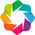

In [293]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

colors = ['#000000']+hv.Cycle('Category20').values

graph = hv.Graph.from_networkx(G, pos)

graph.opts(cmap=colors, node_size=5, edge_line_width=1,
              node_line_color='gray')

hv.extension('bokeh')
hv.output(size=100)
output_file('test.html')
show(hv.render(graph))

## Проверка гипотез

Проверка гипотез

- проверить гипотезу о том, что Лемтюгов – самый популярный хоккеист в лиге, то есть обладающий самым большим количеством одноклубников. Если это не так, составить список наиболее популярных игроков.

- правда ли, что игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше?

- есть ли игроки, у которых отсутствует число Лемтюгова (нет связей через других игроков)?

- каково медианное значение числа Лемтюгова?

- проверить, есть ли связь между количеством переходов и ростом/весом игрока (предполагаем, что игроки, у которых рост выше, лучше играют в хоккей и соответственно чаще переходят из клуба в клуб).

- проверить, верна ли гипотеза о том, что более успешные хоккеисты рождаются в январе-марте.

 ### Проверить гипотезу о том, что Лемтюгов – самый популярный хоккеист в лиге, то есть обладающий самым большим количеством одноклубников. Если это не так, составить список наиболее популярных игроков.

In [294]:
merged_pl2.query('flag ==1').groupby(['player_x', 'link_x'])['link_y'].nunique().sort_values(ascending=False)[:20]# найдем количество одноклубников для каждого игрока, выведем топ-20

player_x              link_x
Evgeny Lapenkov       4351      475
Gennady Stolyarov     548       467
Denis Kazionov        14299     464
Vladimir Galuzin      14815     454
Denis Parshin         494       446
Alexander Lazushin    14674     445
Yakov Rylov           10546     443
Mikhail Grigoryev     14867     437
Ilya Proskuryakov     13871     436
Nikita Tochitsky      15846     430
Alexei Kruchinin      16355     423
Mikhail Zhukov        13679     418
Ilya Krikunov         125       416
Zakhar Arzamastsev    16220     413
Stanislav Galimov     14426     409
Yegor Milovzorov      14257     408
Mikhail Yunkov        595       407
Maxim A. Goncharov    14612     406
Konstantin Glazachev  266       406
Andrei Sergeyev       15416     402
Name: link_y, dtype: int64

Посмотрим на графике самых популярных игроков:

In [295]:
data = merged_pl2.query('flag ==1').groupby(['player_x', 'link_x'],as_index = False)['link_y'].nunique().sort_values(by='link_y', ascending=False)[:15]

fig = px.bar(data, x = 'player_x', y = 'link_y', \
            color_discrete_sequence=['#39B5E0','#4C6793'],\
             text='link_y',height=600, width=1200
             )
fig.update_layout(title =f'Количество одноклубников у игроков, топ-15', xaxis_title= 'игроки',\
                  yaxis_title= 'количество одноклубников',\
                  xaxis={'categoryorder':'total descending'}
                  )


fig.show()

In [296]:
data_L = merged_pl2.query('flag ==1').\
groupby(['player_x', 'link_x'],as_index = False)['link_y'].nunique().sort_values(by='link_y', ascending=False)

Лемтюгов не вошел в топ-15. Найдем количество его одноклубников.

In [297]:
data_L.loc[(data_L['player_x']== 'Nikolai Lemtyugov')]# выведем строку со значением в столбце player_x - Nikolai Lemtyugov

,player_x,link_x,link_y
2588,Nikolai Lemtyugov,13705,357


357 одноклубников

### Правда ли, что игроки с низким значением числа Лемтюгова играли в среднем в большем количестве команд, чем игроки, у которых это значение больше?

In [298]:
merged_pl2.head(1)

,player_link_x,player_x,team,start_date_x,end_date_x,link_x,player_link_y,player_y,start_date_y,end_date_y,link_y,flag
1,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785,https://en.khl.ru/players/19127/?idplayer=1912...,Niclas Andersen,2017-11-17,2018-03-24,19127,0


In [299]:
# посчитаем количество команд у игроков
data_team = merged_pl2.query('flag ==1').groupby(['player_x', 'link_x'],as_index = False)['team'].nunique().sort_values(by='team', ascending=False)
data_team.head(1)

,player_x,link_x,team
942,Denis Kazionov,14299,11


Соединим два датасета с информацией о числе Лемтюгова и количеством команд

In [300]:
lemtyugov_number.sort_values(by='number', ascending=False).head(1)

,link,player,number
2706,28636,Ty Schultz,3


In [301]:
merged_lemtugov_team = data_team.merge(lemtyugov_number,left_on='link_x', right_on='link', how='left' )# соединим датасеты data_team и lemtyugov_number

In [302]:
merged_lemtugov_team.head()

,player_x,link_x,team,link,player,number
0,Denis Kazionov,14299,11,14299,Denis Kazionov,2
1,Alexander Ryazantsev,12990,11,12990,Alexander Ryazantsev,2
2,Gennady Stolyarov,548,11,548,Gennady Stolyarov,2
3,Yakov Rylov,10546,10,10546,Yakov Rylov,2
4,Mikhail Zhukov,13679,10,13679,Mikhail Zhukov,1


H0: Статистически значимой разницы в количестве команд, в которых играли игроки с низким значением числа Лемтюгова и игроки, у которых это значение больше, нет.

H1:Статистически значимая разница в количестве команд, в которых играли игроки с низким значением числа Лемтюгова и игроки, у которых это значение больше, есть.

In [303]:
sample_1 = merged_lemtugov_team.loc[(merged_lemtugov_team['number']== 1)]['team']# набор данных, условие число Лемтюгова =1
sample_2 = merged_lemtugov_team.loc[(merged_lemtugov_team['number']> 1)]['team']# набор данных, условие число Лемтюгова >1

alpha = 0.05 # уровень статистической значимости
# если p-value окажется меньше него, отвергнем гипотезу

results = st.ttest_ind(sample_1, sample_2)

print(results.statistic, 'p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

22.800506898172316 p-значение: 8.17254670675204e-108
Отвергаем нулевую гипотезу


Количество команд, в которых играли игроки с низким значением числа Лемтюгова, отличается от количества команд, в которых играли игроки с высоким значением числа Лемтюгова. Средние различаются на 23%.

### Есть ли игроки, у которых отсутствует число Лемтюгова (нет связей через других игроков)?

In [304]:
#Код ревьюера - проверяем игроков без связей с Лемтюговым
lemtyugov_number.loc[(lemtyugov_number['number']== 999999999)]

,link,player,number


Таких игроков нет

### Каково медианное значение числа Лемтюгова?

In [305]:
lemtyugov_number['number'].median()#найдем медиану числа Лемтюгова

2.0

Медианное значение числа Лемтюгова равно 2.

### Проверить, есть ли связь между количеством переходов и ростом/весом игрока (предполагаем, что игроки, у которых рост выше, лучше играют в хоккей и соответственно чаще переходят из клуба в клуб).

In [306]:
players2.head()

,player_link,player,team,start_date,end_date,link
0,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Jokerit,2014-09-04,2016-03-02,16785
1,https://en.khl.ru/players/16785/?idplayer=1678...,Juhamatti Aaltonen,Metallurg Mg,2010-09-09,2012-03-22,16785
2,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,Vityaz,2021-09-02,2022-01-11,17585
3,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,SKA,2019-12-17,2021-02-27,17585
4,https://en.khl.ru/players/17585/?idplayer=1758...,Miro Aaltonen,Vityaz,2016-08-27,2019-12-09,17585


In [307]:
# найдем количество переходов у игроков
transition = players2.groupby(['link', 'player'],as_index = False).agg(
    num_teams=('team', 'count')).sort_values(by='num_teams', ascending=False)
transition

,link,player,num_teams
3482,4351,Evgeny Lapenkov,14
108,13679,Mikhail Zhukov,14
3601,5433,Gleb Klimenko,13
221,14299,Denis Kazionov,13
3605,548,Gennady Stolyarov,12
...,...,...,...
2219,23356,Jeff Deslauriers,1
872,16125,Alexander Zakirov,1
2217,23351,Calvin Heeter,1
874,16134,Vadim Mitryakov,1


In [308]:
merged_pl2['link_x'].nunique()# проверим

3720

In [309]:
stat_transition = stat2_new[['link','player', 'hight', 'weight']]# выделим некоторые поля stat2_new в отдельный датасет
stat_transition

,link,player,hight,weight
0,16785,Juhamatti Aaltonen,184,89
1,17585,Miro Aaltonen,177,84
2,13041,Ruslan Abdrakhmanov,178,77
3,38736,Jindrich Abdul,185,85
4,24998,Ilnur Abdulkhakov,187,84
...,...,...,...,...
3712,19061,Viktor Zakharov,194,85
3713,16028,Ignat Zemchenko,189,97
3714,15765,Stepan Zhdanov,170,76
3715,16593,Nikolai Zhilin,187,88


In [310]:
stat_transition['link'].nunique()

3717

In [311]:
#соединим таблицы с количеством переходов и данных о весе/росте игроков
merged_stat_transition = stat_transition.merge(transition,left_on='link', right_on='link', how='inner' )
merged_stat_transition#.head(30)

,link,player_x,hight,weight,player_y,num_teams
0,16785,Juhamatti Aaltonen,184,89,Juhamatti Aaltonen,2
1,17585,Miro Aaltonen,177,84,Miro Aaltonen,3
2,13041,Ruslan Abdrakhmanov,178,77,Ruslan Abdrakhmanov,1
3,38736,Jindrich Abdul,185,85,Jindrich Abdul,1
4,24998,Ilnur Abdulkhakov,187,84,Ilnur Abdulkhakov,1
...,...,...,...,...,...,...
3712,19061,Viktor Zakharov,194,85,Viktor Zakharov,1
3713,16028,Ignat Zemchenko,189,97,Ignat Zemchenko,5
3714,15765,Stepan Zhdanov,170,76,Stepan Zhdanov,1
3715,16593,Nikolai Zhilin,187,88,Nikolai Zhilin,1


In [312]:
mergedd = stat2_new.merge(transition,left_on='link', right_on='link', how='inner' )

In [313]:
mergedd['link'].count()

3717

Найдем медианные значения роста и вес игроков

In [314]:
weight_median = merged_stat_transition['weight'].median()
weight_median

87.0

H0: нет статистически значимой разницы в количестве переходов у игроков с разным ростом.

H1: есть статистически значимая разница в количестве переходов у игроков с разным ростом.

In [315]:
hight_median = merged_stat_transition['hight'].median()# найдем медиану роста игроков
# выделим два набора данных, больше и меньше медианного роста
sample_3 = merged_stat_transition.loc[(merged_stat_transition['hight']<= hight_median)]['num_teams']
sample_4 = merged_stat_transition.loc[(merged_stat_transition['hight']> hight_median)]['num_teams']

alpha = 0.05 # уровень статистической значимости
# если p-value окажется меньше него, отвергнем гипотезу

results = st.ttest_ind(sample_3, sample_4,  equal_var=False)

print(results.statistic, 'p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

-1.6938623805254616 p-значение: 0.09038008649736448
Не получилось отвергнуть нулевую гипотезу


Гипотезу о связи между количеством переходов и ростом игрока отвергаем.

H0: нет статистически значимой разницы в количестве переходов у игроков с разным весом.

H1: есть статистически значимая разница в количестве переходов у игроков с разным весом.

In [316]:
weight_median = merged_stat_transition['weight'].median()# найдем медиану веса игроков
# выделим два набора данных, больше и меньше медианного веса

sample_5 = merged_stat_transition.loc[(merged_stat_transition['weight']<= weight_median)]['num_teams']
sample_6 = merged_stat_transition.loc[(merged_stat_transition['weight']> weight_median)]['num_teams']

alpha = 0.05 # уровень статистической значимости
# если p-value окажется меньше него, отвергнем гипотезу

results = st.ttest_ind(sample_5, sample_6,  equal_var=False)

print(results.statistic, 'p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

-11.156710563343138 p-значение: 2.2064160613571706e-28
Отвергаем нулевую гипотезу


Гипотезу о связи количества переходов и весом игрока принимаем.

Посмотрим на графиках:

Связь количества переходов и веса игрока

<Axes: >

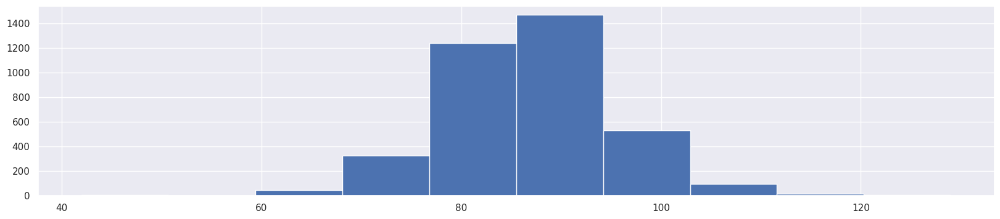

In [317]:
merged_stat_transition['weight'].hist()#value_counts()

<Axes: >

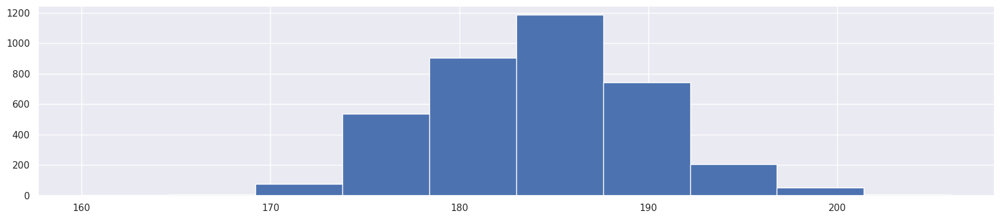

In [318]:
merged_stat_transition['hight'].hist()

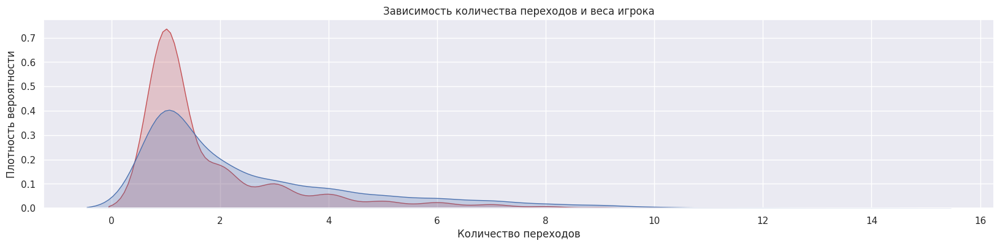

In [319]:
# Plotting the KDE Plot
sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['weight']<= weight_median),'num_teams'], color='r', fill=True)#, Label=87)

sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['weight']> weight_median),'num_teams'], color='b', fill=True)#, Label=87)
plt.title('Зависимость количества переходов и веса игрока')
plt.xlabel('Количество переходов')
plt.ylabel('Плотность вероятности')
plt.show()

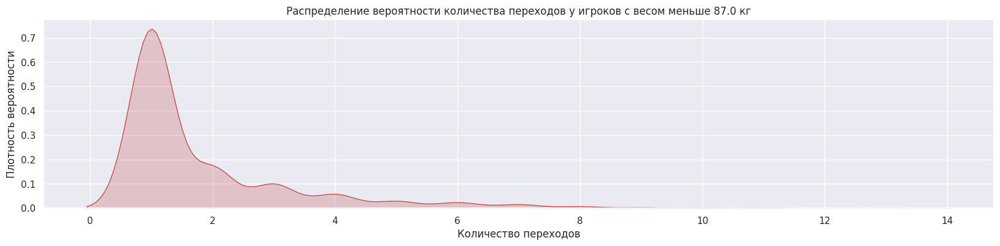

In [320]:
# Plotting the KDE Plot
sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['weight']<= weight_median),'num_teams'], color='r', fill=True)#, Label=87)


plt.title(f'Распределение вероятности количества переходов у игроков с весом меньше {weight_median} кг')
plt.xlabel('Количество переходов')
plt.ylabel('Плотность вероятности')
plt.show()

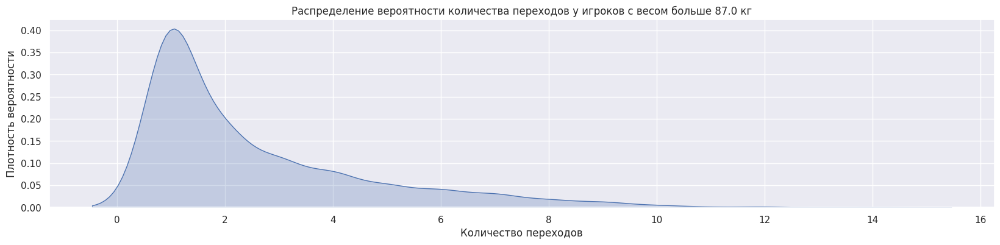

In [321]:
# Plotting the KDE Plot

sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['weight']> weight_median),'num_teams'], color='b', fill=True)#, Label=87)
plt.title(f'Распределение вероятности количества переходов у игроков с весом больше {weight_median} кг')
plt.xlabel('Количество переходов')
plt.ylabel('Плотность вероятности');

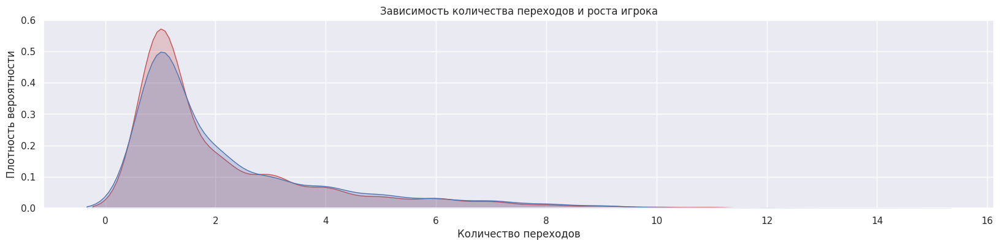

In [322]:
# Plotting the KDE Plot
sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['hight']<= hight_median),'num_teams'], color='r', fill=True)#, Label=87)

sns.kdeplot(merged_stat_transition.loc[(merged_stat_transition['hight']> hight_median),'num_teams'], color='b', fill=True)#, Label=87)
plt.title('Зависимость количества переходов и роста игрока')
plt.xlabel('Количество переходов')
plt.ylabel('Плотность вероятности');

Исследуем эту зависимость:

In [323]:
!pip install phik

In [324]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

In [325]:
data=stat2_new[['hight','age','weight','country', 'position','GP','G', 'Assists', 'PTS']]

In [326]:
data2=mergedd[['num_teams', 'hight','age','weight','country', 'position','GP','G', 'Assists', 'PTS']]

interval columns not set, guessing: ['num_teams', 'hight', 'weight', 'GP', 'G', 'Assists', 'PTS']


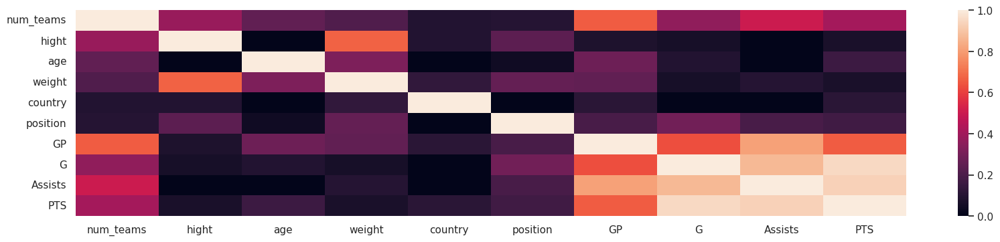

In [327]:
phik_overview = data2.phik_matrix()
sns.heatmap(phik_overview.round(2))
sns.set(rc = {'figure.figsize':(20,4)})

Проверим зависимость веса от возраста, возможно количество переходов больше из-за веса, в силу возрата.

In [328]:
stat2_new['age'].unique()

array(['38', '30', '27', '24', '29', '43', '25', '28', '22', '21', '33',
       '31', '35', '42', '50', '23', '34', '47', '46', '32', '37', '41',
       '20', '40', '36', '7-сент.-11', '39', '53', '45', '52', '19', '44',
       '26', '17', '49', '48', '51', '18', '13-окт.-08', '11-дек.-20',
       '15-июл.-18', '65', '12-сент.-11', '58', '25-мая-23', '54',
       '1-апр.-14', '11-авг.-22', '6-июл.-10', '5-окт.-19', '15-февр.-15',
       '24-июн.-18', '26-сент.-20', '24-июл.-21', '22-июн.-23',
       '7-янв.-16', '5-нояб.-16', '14-июн.-23', '16-июл.-20',
       '21-дек.-15', '31-мар.-13', '11-мая-21', '59', '3-нояб.-21'],
      dtype=object)

In [335]:
list_a = ['13-окт.-08', '11-дек.-20',
       '15-июл.-18',  '12-сент.-11',  '25-мая-23',
       '1-апр.-14', '11-авг.-22', '6-июл.-10', '5-окт.-19', '15-февр.-15',
       '24-июн.-18', '26-сент.-20', '24-июл.-21', '22-июн.-23',
       '7-янв.-16', '5-нояб.-16', '14-июн.-23', '16-июл.-20',
       '21-дек.-15', '31-мар.-13', '11-мая-21', '3-нояб.-21','7-сент.-11']

Записи возраста полной датой ('13-окт.-08') удалим. Так дана информация о дате смерти игрока.

In [336]:
stat2_new2 = stat2_new.query('age not in @list_a')
stat2_new2['age'] = stat2_new2['age'].astype(int)
stat2_new2.age.unique()

<ipython-input-336-4e9540e1cb08>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



array([38, 30, 27, 24, 29, 43, 25, 28, 22, 21, 33, 31, 35, 42, 50, 23, 34,
       47, 46, 32, 37, 41, 20, 40, 36, 39, 53, 45, 52, 19, 44, 26, 17, 49,
       48, 51, 18, 65, 58, 54, 59])

In [337]:
stat2_new2['age'].unique()

array([38, 30, 27, 24, 29, 43, 25, 28, 22, 21, 33, 31, 35, 42, 50, 23, 34,
       47, 46, 32, 37, 41, 20, 40, 36, 39, 53, 45, 52, 19, 44, 26, 17, 49,
       48, 51, 18, 65, 58, 54, 59])

Выделим два дата сета в зависимости от веса игрока:

In [338]:
weight_median_up = merged_stat_transition.loc[(merged_stat_transition['weight']> weight_median),'link']
weight_median_down = merged_stat_transition.loc[(merged_stat_transition['weight']<= weight_median),'link']

In [339]:
w = stat2_new2.query('link in @weight_median_up')
w2 = stat2_new2.query('link in @weight_median_down')

Найдем медианные значения возраста игроков больше 87 кг и меньше 87 кг.

In [360]:
w['age'].median(), w['age'].mean()


(34.0, 34.242476851851855)

Медианный возраст игроков, тяжелее 87 кг - 34 года

In [361]:
w2['age'].median(),w2['age'].mean()

(30.0, 30.36382322713258)

Медианный возраст игроков, легче 87 кг - 30 лет

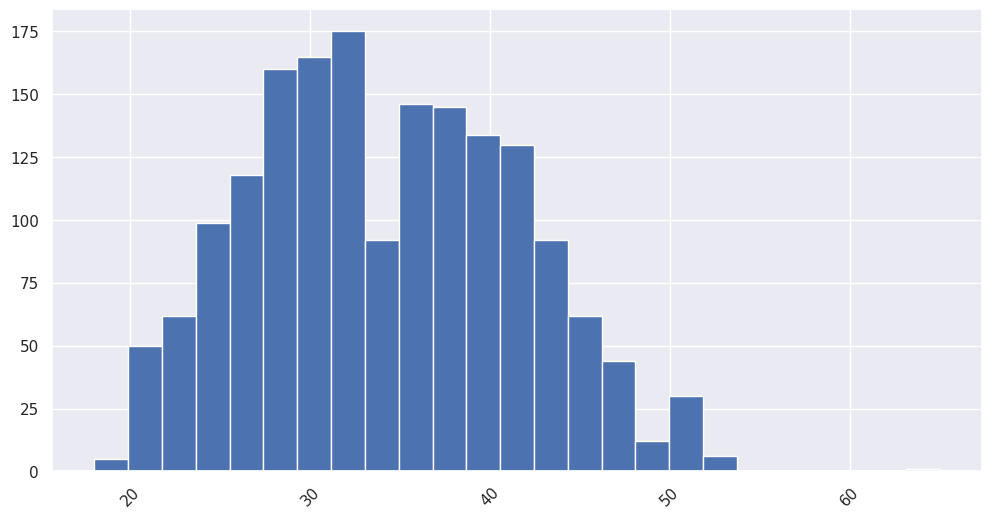

In [342]:
plt.figure(figsize=(12, 6))
w['age'].hist(bins=25)

plt.xticks(rotation=45)  # Изменить наклон подписей на 45 градусов

plt.show()

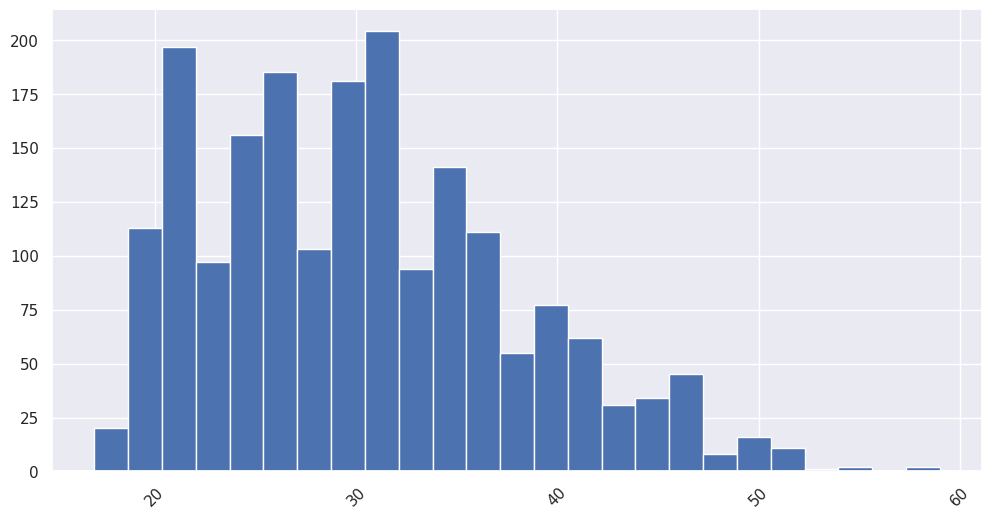

In [343]:
plt.figure(figsize=(12, 6))
w2['age'].hist(bins=25)

plt.xticks(rotation=45)  # Изменить наклон подписей на 45 градусов

plt.show()

Можем сделать вывод, что с возрастом игрок становится тяжелее. Поэтому получили такую зависимость - вес влияет на количество переходов. Т.е. больший вес по медиане у игроков старше, которые дольше играют, а значит переходили из команды в команду, чаще.

### Проверить, верна ли гипотеза о том, что более успешные хоккеисты рождаются в январе-марте.


Возьмем для анализа нападающих. Проверим влияет ли месяц рождения на успешность - количество очков, заработанных в команде.

In [344]:
#удалим лишние столбцы
statistic = stat2_new.loc[(stat2_new['position']=='defense')]\
.drop(columns=['W','L','SOP','GA', 'Sv', '%Sv', 'GAA', 'SO', 'hight', 'weight','shoot', 'player_link', 'TkA', \
               'FOA','BLS', 'HITS', 'SFTSH/G', 'TISH/G', 'SFTE/G',	'TIPP/G',	'SFTPP/G', 'TIE/G', 'SFT/G', 'S/G' , 'age', 'position'])
statistic.head()

,player,born,country,GP,G,Assists,PTS,+/-,+,-,...,OTG,GWG,SDS,SOG,%SOG,FO,FOW,%FO,TOI/G,link
8,Kirill Ablayev,1-мар.-96,Russia,17,0,0,0.0,-2.0,1.0,3.0,...,0.0,0.0,0.0,3,0,0.0,0.0,-,5:25,19276
13,Roman Abrosimov,31-июл.-94,Russia,235,10,23,33.0,-1.0,110.0,111.0,...,0.0,2.0,0.0,228,"4,4",0.0,0.0,-,15:52,17968
15,Kirill Adamchuk,24-мая-94,Russia,188,8,24,32.0,-4.0,88.0,92.0,...,0.0,0.0,1.0,251,"3,2",0.0,0.0,-,17:24,18961
18,Maxim A. Afanasyev,11-янв.-98,Russia,92,2,11,13.0,8.0,39.0,31.0,...,0.0,0.0,0.0,69,"2,9",1.0,0.0,0,11:58,22616
23,Jonas Ahnelov,11-дек.-87,Sweden,159,12,23,35.0,37.0,101.0,64.0,...,0.0,1.0,0.0,170,"7,1",0.0,0.0,-,16:59,23434


In [345]:
# преобразуем дату рождения в формат data
statistic['born'] = statistic['born'].str.replace('янв.', '01', regex=True)
statistic['born'] = statistic['born'].str.replace('февр.', '02', regex=True)
statistic['born'] = statistic['born'].str.replace('мар.', '03', regex=True)
statistic['born'] = statistic['born'].str.replace('апр.', '04', regex=True)
statistic['born'] = statistic['born'].str.replace('мая', '05', regex=True)
statistic['born'] = statistic['born'].str.replace('июн.', '06', regex=True)
statistic['born'] = statistic['born'].str.replace('июл.', '07', regex=True)
statistic['born'] = statistic['born'].str.replace('авг.', '08', regex=True)
statistic['born'] = statistic['born'].str.replace('сент.', '09', regex=True)
statistic['born'] = statistic['born'].str.replace('окт.', '10', regex=True)
statistic['born'] = statistic['born'].str.replace('нояб.', '11', regex=True)
statistic['born'] = statistic['born'].str.replace('дек.', '12', regex=True)
statistic['born'] = pd.to_datetime(statistic['born'], format='%d-%m-%y')

In [346]:
# выделим месяц
statistic['mon'] = statistic['born'].dt.month


In [347]:
statistic.columns #расшифровка столбцов

Index(['player', 'born', 'country', 'GP', 'G', 'Assists', 'PTS', '+/-', '+',
       '-', 'PIM', 'ESG', 'PPG', 'SHG', 'OTG', 'GWG', 'SDS', 'SOG', '%SOG',
       'FO', 'FOW', '%FO', 'TOI/G', 'link', 'mon'],
      dtype='object')

'GP-количество игр

'G'- количество голов

'Assists' - передачи

'PTS' - очки

'+/-' - +/- очки

'+' - очки

'-' - очки

'PIM' - штрафное время

'ESG' - шайбы, заброшенные в равернсве

'PPG' - шайбы, заброшенные в большинстве

'SHG' - шайбы, заброшенные в меньшенстве

'OTG' - шайбы, заброшенные в овертайме

'GWG' - победные голы

'SDS' - решаюшие буллиты

'SOG' - броски по воротам

'%SOG' - % реализованных бросков по воротам

'FO' - вбрасывания

'FOW' - выигранные вбрасывания

'%FO' - % выигранных вбрасываний


In [348]:
#statistic.head(50)

Зависимость от даты рождения очков игрока PTS:

Гипотеза H0: различий в очках PTS между игроками, которые родились с января по март, и игроками, которые родились с апреля по декабрь, нет.

Гипотеза H1: различия в очках PTS между игроками, которые родились с января по март, и игроками, которые родились с апреля по декабрь, есть.

In [349]:
sample_7 = statistic.query('mon==3 or mon==2 or mon==1')['PTS']
sample_8 = statistic.query('mon!=3 and mon!=2 and mon!=1')['PTS']

alpha = 0.05 # уровень статистической значимости
# если p-value окажется меньше него, отвергнем гипотезу

results = st.ttest_ind(sample_7, sample_8,  equal_var=False)

print(results.statistic, 'p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

0.9097720790527537 p-значение: 0.36337034932180456
Не получилось отвергнуть нулевую гипотезу


Посмотрим на зависимость от даты рождения % реализованных бросков по воротам у игрока

Гипотеза H0: различий в % реализованных бросков по воротам между игроками, которые родились с января по март, и игроками, которые родились с апреля по декабрь, нет.

Гипотеза H1: различия в % реализованных бросков по воротам между игроками, которые родились с января по март, и игроками, которые родились с апреля по декабрь, есть.

In [350]:
statistic2 = statistic.loc[(statistic['%SOG']!= '-')].copy()#уберем из датасета данные с прочерками


In [351]:
statistic2['%SOG'] = statistic2['%SOG'].apply(lambda x: float(x.split()[0].replace(',', '.')))#преобразуем тип столбца в числовой

In [352]:
sample_9 = statistic2.query('mon==3 or mon==2 or mon==1')['%SOG']
sample_10 = statistic2.query('mon!=3 and mon!=2 and mon!=1')['%SOG']

alpha = 0.05 # уровень статистической значимости
# если p-value окажется меньше него, отвергнем гипотезу

results = st.ttest_ind(sample_9, sample_10,  equal_var=False)

print(results.statistic, 'p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

-0.8579308002989287 p-значение: 0.391269028175505
Не получилось отвергнуть нулевую гипотезу


Нельзя сказать, что есть зависимость % реализованных бросков по воротам от месяца рождения

Посмотрим в какие месяца родилось больше всего игроков (нападающие):

In [353]:
statistic['mon'].value_counts()

5     124
1     122
7     112
4     108
3     104
2     103
6      97
8      92
9      86
10     76
11     73
12     68
Name: mon, dtype: int64

Посмотрим месяц рождения всех игроков:

In [354]:
mon_stat = stat2_new

In [355]:
mon_stat['born'] = mon_stat['born'].str.replace('янв.', '01', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('февр.', '02', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('мар.', '03', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('апр.', '04', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('мая', '05', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('июн.', '06', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('июл.', '07', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('авг.', '08', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('сент.', '09', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('окт.', '10', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('нояб.', '11', regex=True)
mon_stat['born'] = mon_stat['born'].str.replace('дек.', '12', regex=True)
mon_stat['born'] = pd.to_datetime(mon_stat['born'], format='%d-%m-%y')

In [356]:
# выделим месяц
mon_stat['mon'] = mon_stat['born'].dt.month


In [357]:
mon_stat['mon'].value_counts()

1     422
3     363
4     356
2     354
5     353
6     329
7     326
8     285
9     256
10    235
11    233
12    205
Name: mon, dtype: int64

In [358]:

mon_stat.loc[(mon_stat['position']== 'forward')]['mon'].value_counts()

1     252
2     206
3     200
5     188
4     188
6     185
7     171
8     159
9     137
10    131
11    130
12    114
Name: mon, dtype: int64

In [359]:
mon_stat.loc[(mon_stat['position']== 'goaltender')]['mon'].value_counts()

4     60
3     59
1     48
6     47
2     45
7     43
5     41
8     34
9     33
11    30
10    28
12    23
Name: mon, dtype: int64

Нападающие, чаще всего рождались в мае и январе, защитники с января по март, вратари в марте и апреле. По всем игрокам видим, что наибольшее число родились в месяца первого получгодия. Возможно это из-за того, что при отборе детей в команды по возрасту, у детей которые родились раньше на несколько месяцев своих сверстников больше шансов, они старше, более развиты физически.

## Вывод:
- Мы обработали данные, полученнные с сайта https://en.khl.ru/.
- Выделили одноклубников. Самым популярным хоккеистом оказался Евгений Лапенков, у него 475 одноклубников. У Николая Лемтюгова 357, он не вошел в топ-15 популярных игроков.
 - Рассчитали с помощью математического модели графа длинну пути каждого игрока до Николая Лемтюгова. Каждый игрок знаком с ним максимум через 3 игроков. Нашли медианное и среднее значение числа Лемтюгова - 2 и 1.9 соответственно. У более молодых игроков среднее и медианное значения "числа Лемтюгова" больше, что логично, они в начале карьеры.
 - Проверка гипотез показала, что, чем меньше число Лемтюгова, тем в большем количестве команд играл хоккеист. Нет зависимости между количеством переходов и ростом игрока, но есть зависимость от веса игрока. Более тяжелые игроки чаще переходят из команды в команду. Так же не подтвердилась гипотеза о том, что игроки, рожденные с января по март более успешные.